In [1]:
import os
os.getpid()

12396

In [2]:
# set seed for reproducibility
SEED = 123

In [3]:
from pathlib import Path
import re

import pandas as pd
import numpy as np

import xgboost as xgb
import datasist as ds

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression

from tqdm.auto import tqdm
tqdm.pandas()

In [4]:
train_df = pd.read_csv('data/train.csv')

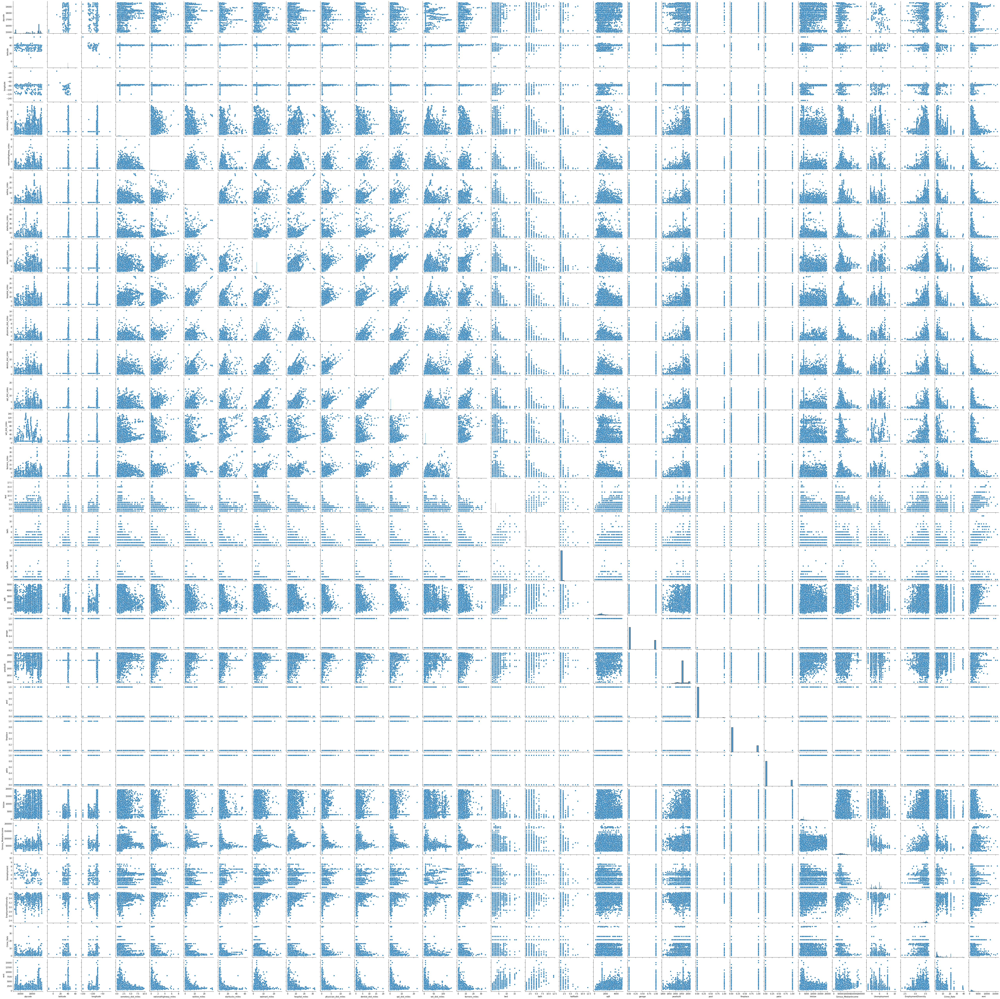

In [5]:
import seaborn as sns
fig = sns.pairplot(train_df)
fig.savefig('pairplot.png')

In [6]:
ds.structdata.describe(train_df)

First five data points


,id,county,city,zipcode,address,state,latitude,longitude,cemetery_dist_miles,nationalhighway_miles,...,yearbuilt,pool,fireplace,patio,lotsize,Census_MedianIncome,Unemployment,EmploymentDiversity,Crime_Rate,rent
0,train_0,NaN,WEXFORD,NaN,266 Clematis Dr Allegheny County,PA,40.618200,-80.077600,1.019586,0.206222,...,2008,0,1,0,4086.388045,54476.09,5.1,3.48,2.4,2400
1,train_1,NaN,WHITEHALL,NaN,2310 N 1st Ave Lehigh County,PA,40.649906,-75.478940,1.019586,0.206222,...,1935,0,0,0,2247.513425,54476.09,5.1,3.48,2.4,995
2,train_2,NaN,WHITEHALL,NaN,3338 St Stephens Ln Lehigh County,PA,40.646282,-75.510056,1.019586,0.206222,...,2006,0,1,1,3109.741302,54476.09,5.1,3.48,2.4,1740
3,train_3,NaN,WAYNESBORO,NaN,97 W Main St Franklin County,PA,39.756992,-77.579704,1.019586,0.206222,...,1960,0,0,0,2349.673126,54476.09,5.1,3.48,2.4,675
4,train_4,NaN,QUAKERTOWN,NaN,200 E Broad St Bucks County,PA,40.441177,-75.332540,1.019586,0.206222,...,1960,0,0,0,2043.194023,54476.09,5.1,3.48,2.4,1300




Random five data points


,id,county,city,zipcode,address,state,latitude,longitude,cemetery_dist_miles,nationalhighway_miles,...,yearbuilt,pool,fireplace,patio,lotsize,Census_MedianIncome,Unemployment,EmploymentDiversity,Crime_Rate,rent
12459,train_12459,PHILADELPHIA,PHILADELPHIA,19135.0,7024 TORRESDALE AVE,PA,40.027857,-75.040124,0.672789,0.051848,...,1960,0,0,0,2500.000000,34862.81,6.00,3.53,21.328510,1450
234,train_234,ALLEGHENY,PITTSBURGH,15210.0,2304 SPRING ST,PA,40.416048,-79.974472,0.356778,0.755200,...,1960,0,0,1,6360.000000,42499.00,5.00,3.39,15.127777,1299
7749,train_7749,LANCASTER,LANCASTER,17603.0,243 N QUEEN ST,PA,40.042335,-76.306235,0.218974,0.014459,...,1960,0,0,1,3049.000000,40402.22,4.00,3.35,8.808179,850
11213,train_11213,MONTGOMERY,LANSDALE,19446.0,623 FRANKLIN ST,PA,40.232387,-75.288109,0.980918,0.653761,...,1960,0,0,0,5975.000000,78756.59,4.00,3.51,1.900000,2200
4099,train_4099,BUTLER,ZELIENOPLE,16063.0,Route 68 West,PA,40.798676,-80.129192,1.019586,0.206222,...,1960,0,0,1,7612.940928,52655.25,5.26,3.52,0.800000,1100




Last five data points


,id,county,city,zipcode,address,state,latitude,longitude,cemetery_dist_miles,nationalhighway_miles,...,yearbuilt,pool,fireplace,patio,lotsize,Census_MedianIncome,Unemployment,EmploymentDiversity,Crime_Rate,rent
24264,train_24264,CHESTER,NOTTINGHAM,19362.0,530 E CHRISTINE RD,PA,39.747862,-76.015432,1.038002,0.501402,...,1908,0,0,0,2872.730796,62732.64,3.66,3.48,0.600000,1400
24265,train_24265,CHESTER,WEST CHESTER,19380.0,1510 ULSTER WAY,PA,40.002123,-75.569484,2.038375,0.751311,...,1999,0,1,0,2765.000000,85748.69,3.66,3.58,1.729195,2750
24266,train_24266,NORTHAMPTON,BETHLEHEM,18020.0,1801 Chestnut Place,PA,39.756499,-105.000903,1.019586,0.206222,...,1960,0,1,1,2549.906140,84374.00,5.16,3.56,0.432516,1670
24267,train_24267,LUZERNE,HARVEYS LAKE,18618.0,26 Pear St Luzerne County,PA,41.376760,-76.038795,1.019586,0.206222,...,1960,0,1,0,2247.513425,58089.90,6.46,3.63,1.100000,1600
24268,train_24268,PHILADELPHIA,PHILADELPHIA,19114.0,Torresdale Philadelphia County,PA,40.045547,-74.989840,1.019586,0.206222,...,1972,0,0,0,3444.825122,52786.21,6.43,3.52,1.468825,850




Shape of  data set: (24269, 35)


Size of  data set: 849415


Data Types
Note: All Non-numerical features are identified as objects in pandas


,Data Type
id,object
county,object
city,object
zipcode,float64
address,object
state,object
latitude,float64
longitude,float64
cemetery_dist_miles,float64
nationalhighway_miles,float64




Numerical Features in Data set
['zipcode', 'latitude', 'longitude', 'cemetery_dist_miles', 'nationalhighway_miles', 'railline_miles', 'starbucks_miles', 'walmart_miles', 'hospital_miles', 'physician_dist_miles', 'dentist_dist_miles', 'opt_dist_miles', 'vet_dist_miles', 'farmers_miles', 'bed', 'bath', 'halfbath', 'sqft', 'garage', 'yearbuilt', 'pool', 'fireplace', 'patio', 'lotsize', 'Census_MedianIncome', 'Unemployment', 'EmploymentDiversity', 'Crime_Rate', 'rent']


Categorical Features in Data set


['id', 'county', 'city', 'address', 'state', 'property_type']



Statistical Description of Columns


,zipcode,latitude,longitude,cemetery_dist_miles,nationalhighway_miles,railline_miles,starbucks_miles,walmart_miles,hospital_miles,physician_dist_miles,...,yearbuilt,pool,fireplace,patio,lotsize,Census_MedianIncome,Unemployment,EmploymentDiversity,Crime_Rate,rent
count,24235.000000,24269.000000,24269.000000,24269.000000,24269.000000,24269.000000,24269.000000,24269.000000,24269.000000,24269.000000,...,24269.000000,24269.000000,24269.000000,24269.000000,24269.000000,24269.000000,24269.000000,24269.000000,24269.000000,24269.000000
mean,18030.844564,40.080788,-77.241598,1.206987,0.290908,1.049048,2.042534,3.528326,2.269302,0.352973,...,1958.995014,0.011455,0.206972,0.197948,3669.835108,57016.945681,5.187826,3.438248,6.394034,1599.895505
std,1477.571555,1.637096,5.817313,0.927508,0.364962,1.574878,3.205261,1.794201,2.467797,0.551741,...,23.278187,0.106415,0.405144,0.398461,3185.150540,23918.805643,0.956070,0.150563,7.345398,916.256058
min,15001.000000,-12.116930,-149.900278,0.022214,0.000027,0.000248,0.013197,0.118545,0.041096,0.000087,...,1800.000000,0.000000,0.000000,0.000000,1.000000,0.000000,2.970000,2.350000,0.000000,385.000000
25%,17111.000000,39.966766,-77.008588,0.818566,0.143624,0.465909,0.959076,2.712467,1.160151,0.170974,...,1960.000000,0.000000,0.000000,0.000000,1712.000000,40817.450000,4.500000,3.370000,1.468825,1000.000000
50%,18944.000000,40.130169,-75.475763,1.019586,0.206222,0.629888,1.348776,3.326397,1.584675,0.229126,...,1960.000000,0.000000,0.000000,0.000000,2872.730796,54476.090000,5.100000,3.480000,2.400000,1400.000000
75%,19128.000000,40.444389,-75.185042,1.227709,0.281964,0.860038,1.789913,3.870699,2.196950,0.299176,...,1960.000000,0.000000,0.000000,0.000000,4266.189119,70379.790000,6.000000,3.540000,9.136104,1895.000000
max,19611.000000,61.218056,-11.706829,9.747778,7.920969,28.306430,63.618152,26.409748,32.433629,14.301216,...,2016.000000,1.000000,1.000000,1.000000,19341.000000,198425.570000,10.000000,3.670000,39.159639,16000.000000




Description of Categorical Features


,count,unique,top,freq
id,24269,24269,train_619,1
county,24235,64,PHILADELPHIA,6674
city,24269,717,PHILADELPHIA,6674
address,23317,18849,Center City East Philadelphia County,66
state,24269,1,PA,24269
property_type,20643,5,Condo,9811




Unique class Count of Categorical features


,Feature,Unique Count
0,id,24269
1,county,65
2,city,717
3,address,18850
4,state,1
5,property_type,6




Missing Values in Data


,features,missing_counts,missing_percent
0,id,0,0.0
1,county,34,0.1
2,city,0,0.0
3,zipcode,34,0.1
4,address,952,3.9
5,state,0,0.0
6,latitude,0,0.0
7,longitude,0,0.0
8,cemetery_dist_miles,0,0.0
9,nationalhighway_miles,0,0.0


In [7]:
ds.structdata.get_unique_counts(train_df)

,Feature,Unique Count
0,id,24269
1,county,65
2,city,717
3,address,18850
4,state,1
5,property_type,6


In [8]:
ds.feature_engineering.drop_redundant(train_df)

Dropped ['state']


,id,county,city,zipcode,address,latitude,longitude,cemetery_dist_miles,nationalhighway_miles,railline_miles,...,yearbuilt,pool,fireplace,patio,lotsize,Census_MedianIncome,Unemployment,EmploymentDiversity,Crime_Rate,rent
0,train_0,NaN,WEXFORD,NaN,266 Clematis Dr Allegheny County,40.618200,-80.077600,1.019586,0.206222,0.629888,...,2008,0,1,0,4086.388045,54476.09,5.10,3.48,2.400000,2400
1,train_1,NaN,WHITEHALL,NaN,2310 N 1st Ave Lehigh County,40.649906,-75.478940,1.019586,0.206222,0.629888,...,1935,0,0,0,2247.513425,54476.09,5.10,3.48,2.400000,995
2,train_2,NaN,WHITEHALL,NaN,3338 St Stephens Ln Lehigh County,40.646282,-75.510056,1.019586,0.206222,0.629888,...,2006,0,1,1,3109.741302,54476.09,5.10,3.48,2.400000,1740
3,train_3,NaN,WAYNESBORO,NaN,97 W Main St Franklin County,39.756992,-77.579704,1.019586,0.206222,0.629888,...,1960,0,0,0,2349.673126,54476.09,5.10,3.48,2.400000,675
4,train_4,NaN,QUAKERTOWN,NaN,200 E Broad St Bucks County,40.441177,-75.332540,1.019586,0.206222,0.629888,...,1960,0,0,0,2043.194023,54476.09,5.10,3.48,2.400000,1300
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24264,train_24264,CHESTER,NOTTINGHAM,19362.0,530 E CHRISTINE RD,39.747862,-76.015432,1.038002,0.501402,14.216913,...,1908,0,0,0,2872.730796,62732.64,3.66,3.48,0.600000,1400
24265,train_24265,CHESTER,WEST CHESTER,19380.0,1510 ULSTER WAY,40.002123,-75.569484,2.038375,0.751311,2.018855,...,1999,0,1,0,2765.000000,85748.69,3.66,3.58,1.729195,2750
24266,train_24266,NORTHAMPTON,BETHLEHEM,18020.0,1801 Chestnut Place,39.756499,-105.000903,1.019586,0.206222,0.629888,...,1960,0,1,1,2549.906140,84374.00,5.16,3.56,0.432516,1670
24267,train_24267,LUZERNE,HARVEYS LAKE,18618.0,26 Pear St Luzerne County,41.376760,-76.038795,1.019586,0.206222,0.629888,...,1960,0,1,0,2247.513425,58089.90,6.46,3.63,1.100000,1600


In [9]:
train_df.columns.shape

(35,)

We have 35 columns in the dataset, including the 'rent' column. We'll look at each of these columns individually.

In [10]:
train_df.columns

Index(['id', 'county', 'city', 'zipcode', 'address', 'state', 'latitude',
       'longitude', 'cemetery_dist_miles', 'nationalhighway_miles',
       'railline_miles', 'starbucks_miles', 'walmart_miles', 'hospital_miles',
       'physician_dist_miles', 'dentist_dist_miles', 'opt_dist_miles',
       'vet_dist_miles', 'farmers_miles', 'bed', 'bath', 'halfbath', 'sqft',
       'property_type', 'garage', 'yearbuilt', 'pool', 'fireplace', 'patio',
       'lotsize', 'Census_MedianIncome', 'Unemployment', 'EmploymentDiversity',
       'Crime_Rate', 'rent'],
      dtype='object')

In [11]:
train_df.sample(2)

,id,county,city,zipcode,address,state,latitude,longitude,cemetery_dist_miles,nationalhighway_miles,...,yearbuilt,pool,fireplace,patio,lotsize,Census_MedianIncome,Unemployment,EmploymentDiversity,Crime_Rate,rent
12595,train_12595,PHILADELPHIA,PHILADELPHIA,19121.0,1736 N SYDENHAM ST,PA,39.980075,-75.160314,1.381868,0.136462,...,1960,0,0,0,1034.000000,14846.61,6.00,3.40,21.32851,3475
3560,train_3560,BUCKS,LEVITTOWN,19057.0,24 Elizabeth Ln,PA,40.140137,-74.850136,1.019586,0.206222,...,1960,0,0,0,3457.084286,60918.35,4.53,3.48,0.70000,1100


In [12]:
train_df.describe()

,zipcode,latitude,longitude,cemetery_dist_miles,nationalhighway_miles,railline_miles,starbucks_miles,walmart_miles,hospital_miles,physician_dist_miles,...,yearbuilt,pool,fireplace,patio,lotsize,Census_MedianIncome,Unemployment,EmploymentDiversity,Crime_Rate,rent
count,24235.000000,24269.000000,24269.000000,24269.000000,24269.000000,24269.000000,24269.000000,24269.000000,24269.000000,24269.000000,...,24269.000000,24269.000000,24269.000000,24269.000000,24269.000000,24269.000000,24269.000000,24269.000000,24269.000000,24269.000000
mean,18030.844564,40.080788,-77.241598,1.206987,0.290908,1.049048,2.042534,3.528326,2.269302,0.352973,...,1958.995014,0.011455,0.206972,0.197948,3669.835108,57016.945681,5.187826,3.438248,6.394034,1599.895505
std,1477.571555,1.637096,5.817313,0.927508,0.364962,1.574878,3.205261,1.794201,2.467797,0.551741,...,23.278187,0.106415,0.405144,0.398461,3185.150540,23918.805643,0.956070,0.150563,7.345398,916.256058
min,15001.000000,-12.116930,-149.900278,0.022214,0.000027,0.000248,0.013197,0.118545,0.041096,0.000087,...,1800.000000,0.000000,0.000000,0.000000,1.000000,0.000000,2.970000,2.350000,0.000000,385.000000
25%,17111.000000,39.966766,-77.008588,0.818566,0.143624,0.465909,0.959076,2.712467,1.160151,0.170974,...,1960.000000,0.000000,0.000000,0.000000,1712.000000,40817.450000,4.500000,3.370000,1.468825,1000.000000
50%,18944.000000,40.130169,-75.475763,1.019586,0.206222,0.629888,1.348776,3.326397,1.584675,0.229126,...,1960.000000,0.000000,0.000000,0.000000,2872.730796,54476.090000,5.100000,3.480000,2.400000,1400.000000
75%,19128.000000,40.444389,-75.185042,1.227709,0.281964,0.860038,1.789913,3.870699,2.196950,0.299176,...,1960.000000,0.000000,0.000000,0.000000,4266.189119,70379.790000,6.000000,3.540000,9.136104,1895.000000
max,19611.000000,61.218056,-11.706829,9.747778,7.920969,28.306430,63.618152,26.409748,32.433629,14.301216,...,2016.000000,1.000000,1.000000,1.000000,19341.000000,198425.570000,10.000000,3.670000,39.159639,16000.000000


### We'll check the missing values per column.

In [13]:
train_df.isnull().sum()

id                          0
county                     34
city                        0
zipcode                    34
address                   952
state                       0
latitude                    0
longitude                   0
cemetery_dist_miles         0
nationalhighway_miles       0
railline_miles              0
starbucks_miles             0
walmart_miles               0
hospital_miles              0
physician_dist_miles        0
dentist_dist_miles          0
opt_dist_miles              0
vet_dist_miles              0
farmers_miles               0
bed                         0
bath                        0
halfbath                    0
sqft                        0
property_type            3626
garage                      0
yearbuilt                   0
pool                        0
fireplace                   0
patio                       0
lotsize                     0
Census_MedianIncome         0
Unemployment                0
EmploymentDiversity         0
Crime_Rate

Most columns don't contain missing values. Only `property_type` and `address` have many missing values; there are a few in`county` and `zipcode`

======================================

### `County`

In [14]:
train_df['county'].value_counts(dropna=False)

PHILADELPHIA    6674
ALLEGHENY       3460
MONTGOMERY      1922
DELAWARE        1210
CHESTER         1143
                ... 
VENANGO            2
JEFFERSON          2
ARMSTRONG          1
JUNIATA            1
SULLIVAN           1
Name: county, Length: 65, dtype: int64

#### Where is `county` null?

In [15]:
county_null_idxs = train_df[train_df['county'].isnull()].index
train_df.loc[county_null_idxs]

,id,county,city,zipcode,address,state,latitude,longitude,cemetery_dist_miles,nationalhighway_miles,...,yearbuilt,pool,fireplace,patio,lotsize,Census_MedianIncome,Unemployment,EmploymentDiversity,Crime_Rate,rent
0,train_0,NaN,WEXFORD,NaN,266 Clematis Dr Allegheny County,PA,40.618200,-80.077600,1.019586,0.206222,...,2008,0,1,0,4086.388045,54476.09,5.1,3.48,2.4,2400
1,train_1,NaN,WHITEHALL,NaN,2310 N 1st Ave Lehigh County,PA,40.649906,-75.478940,1.019586,0.206222,...,1935,0,0,0,2247.513425,54476.09,5.1,3.48,2.4,995
2,train_2,NaN,WHITEHALL,NaN,3338 St Stephens Ln Lehigh County,PA,40.646282,-75.510056,1.019586,0.206222,...,2006,0,1,1,3109.741302,54476.09,5.1,3.48,2.4,1740
3,train_3,NaN,WAYNESBORO,NaN,97 W Main St Franklin County,PA,39.756992,-77.579704,1.019586,0.206222,...,1960,0,0,0,2349.673126,54476.09,5.1,3.48,2.4,675
4,train_4,NaN,QUAKERTOWN,NaN,200 E Broad St Bucks County,PA,40.441177,-75.332540,1.019586,0.206222,...,1960,0,0,0,2043.194023,54476.09,5.1,3.48,2.4,1300
5,train_5,NaN,WAYNESBORO,NaN,407 Viewpoint Way Franklin County,PA,39.766594,-77.582490,1.019586,0.206222,...,2012,0,0,0,2635.720289,54476.09,5.1,3.48,2.4,1025
6,train_6,NaN,WAYNESBORO,NaN,403 Viewpoint Way Franklin County,PA,39.766580,-77.582450,1.019586,0.206222,...,2012,0,0,0,2635.720289,54476.09,5.1,3.48,2.4,1025
7,train_7,NaN,WAYNESBORO,NaN,240 Crown Ct Franklin County,PA,39.759663,-77.575090,1.019586,0.206222,...,2007,0,0,0,2635.720289,54476.09,5.1,3.48,2.4,1025
8,train_8,NaN,WAYNESBORO,NaN,101 S Potomac St Franklin County,PA,39.755530,-77.581154,1.019586,0.206222,...,1960,0,0,0,2451.832827,54476.09,5.1,3.48,2.4,795
9,train_9,NaN,UPPER DARBY,NaN,446 Woodcliffe Rd Delaware County,PA,39.958010,-75.264300,1.019586,0.206222,...,1960,0,0,0,2051.366799,54476.09,5.1,3.48,2.4,925


In [16]:
reg = re.compile(r'(\w+) \s+ County$', flags=re.VERBOSE|re.IGNORECASE)
def replace_nan_county(address):
    if pd.isnull(address):
        return np.nan
    
    match = reg.search(address)
    if match is None:
#         print(address)
        return np.nan

    county = match[1].upper()
#     print(match[1], address)
    return county

In [17]:
train_df['address'].loc[county_null_idxs].isnull().sum()

0

In [18]:
train_df['county'].loc[county_null_idxs] = train_df['address'].loc[county_null_idxs].progress_apply(replace_nan_county)

  0%|          | 0/34 [00:00<?, ?it/s]

/home/dev2/anaconda3/envs/abzooba/lib/python3.9/site-packages/pandas/core/indexing.py:1637: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


In [19]:
def fill_county_nans(train_df):
    out_df = train_df.copy()

    county_null_idxs = train_df[train_df['county'].isnull()].index
    out_df['county'].loc[county_null_idxs] = train_df['address'].loc[county_null_idxs].progress_apply(replace_nan_county)
    return out_df

In [20]:
train_df = fill_county_nans(train_df)

0it [00:00, ?it/s]

In [21]:
train_df['county'].isnull().sum()

0

**We thus observed that the county info was given in the address column and filled *all* missing values in that column accordingly.**

======================================

### `City`

In [22]:
train_df['city'].isnull().sum()

0

In [23]:
train_df['city'].value_counts()

PHILADELPHIA    6674
PITTSBURGH      2789
HARRISBURG       573
YORK             453
ALLENTOWN        389
                ... 
FACTORYVILLE       1
FRIEDENSBURG       1
TREXLERTOWN        1
SMITHFIELD         1
TWIN ROCKS         1
Name: city, Length: 717, dtype: int64

This can be treated as a categorical column

In [24]:
train_df['city'] = train_df['city'].astype('category')

======================================

### `zipcode`

In [25]:
train_df['zipcode'].isnull().sum()

34

In [26]:
train_df['zipcode'].sample(3)

15145    19145.0
16930    19116.0
14859    19143.0
Name: zipcode, dtype: float64

The zipcode is technically a categorical variable, but we'll ignore it for now. Most of its info is already contained in the city, etc. columns.

======================================

### `Address`

In [27]:
train_df['address'].isnull().sum()

952

There are a fair few null addresses. Additionally, address is not necessarily meaningful, since street names, etc. don't necessarily affect rent. We'll not consider address for now.

======================================

In [28]:
### `State`

In [29]:
train_df['state'].value_counts(dropna=False)

PA    24269
Name: state, dtype: int64

Since all properties in `state` are the same, we can drop this column for now.

======================================

### `latitude` and `longitude`

In [30]:
train_df[['latitude', 'longitude']]

,latitude,longitude
0,40.618200,-80.077600
1,40.649906,-75.478940
2,40.646282,-75.510056
3,39.756992,-77.579704
4,40.441177,-75.332540
...,...,...
24264,39.747862,-76.015432
24265,40.002123,-75.569484
24266,39.756499,-105.000903
24267,41.376760,-76.038795


We'll take these to be continuous values, although there are probably better ways to embed latitude and longitude.

======================================

In [31]:
train_df[['cemetery_dist_miles', 'nationalhighway_miles',
       'railline_miles', 'starbucks_miles', 'walmart_miles', 'hospital_miles',
       'physician_dist_miles', 'dentist_dist_miles', 'opt_dist_miles',
       'vet_dist_miles', 'farmers_miles']]

,cemetery_dist_miles,nationalhighway_miles,railline_miles,starbucks_miles,walmart_miles,hospital_miles,physician_dist_miles,dentist_dist_miles,opt_dist_miles,vet_dist_miles,farmers_miles
0,1.019586,0.206222,0.629888,1.348776,3.326397,1.584675,0.229126,0.472933,0.651244,7.323725,1.094678
1,1.019586,0.206222,0.629888,1.348776,3.326397,1.584675,0.229126,0.472933,0.651244,7.323725,1.094678
2,1.019586,0.206222,0.629888,1.348776,3.326397,1.584675,0.229126,0.472933,0.651244,7.323725,1.094678
3,1.019586,0.206222,0.629888,1.348776,3.326397,1.584675,0.229126,0.472933,0.651244,7.323725,1.094678
4,1.019586,0.206222,0.629888,1.348776,3.326397,1.584675,0.229126,0.472933,0.651244,7.323725,1.094678
...,...,...,...,...,...,...,...,...,...,...,...
24264,1.038002,0.501402,14.216913,10.705050,4.077947,8.532233,2.134659,4.760968,3.086840,16.171035,14.446968
24265,2.038375,0.751311,2.018855,0.262683,3.540874,2.815036,0.266310,0.273347,1.256893,13.466616,3.474891
24266,1.019586,0.206222,0.629888,1.348776,3.326397,1.584675,0.229126,0.472933,0.651244,7.323725,1.094678
24267,1.019586,0.206222,0.629888,1.348776,3.326397,1.584675,0.229126,0.472933,0.651244,7.323725,1.094678


These are all continuous values.

======================================

### `bed`

In [32]:
train_df['bed'].value_counts(dropna=False)

2     7521
3     7465
1     3897
4     3497
6      897
5      633
8      179
9       69
12      52
10      24
7       21
15      10
16       3
18       1
Name: bed, dtype: int64

This can be both continuous and categorical; we'll take it as continuous for now

======================================

### `bath`

In [33]:
train_df['bath'].value_counts(dropna=False)

1     12870
2      9057
3      1504
4       612
6       119
5        64
8        22
7         8
9         7
12        5
10        1
Name: bath, dtype: int64

======================================

### `halfbath`

In [34]:
train_df['halfbath'].value_counts(dropna=False)

1     23724
2       490
4        27
3        22
6         2
7         2
8         1
12        1
Name: halfbath, dtype: int64

======================================

### `sqft`

In [35]:
train_df['sqft'].value_counts(dropna=False)

1345    1019
1200     615
1000     584
1100     411
900      409
        ... 
246        1
2690       1
2658       1
2642       1
1803       1
Name: sqft, Length: 3006, dtype: int64

This is a continuous valued column.

======================================

### `property_type`

In [36]:
train_df['property_type'].value_counts(dropna=False)

Condo       9811
SFR         8175
NaN         3626
Duplex      2219
Triplex      330
Quadplex     108
Name: property_type, dtype: int64

There are a lot of missing values here. However, this can be valuable for rent prediction; we'll consider it as a categorical column.

======================================

### `garage`

In [37]:
train_df['garage'].value_counts(dropna=False)

0    17185
1     7084
Name: garage, dtype: int64

This is a Boolean column with no missing values.

======================================

In [38]:
train_df['yearbuilt'].value_counts(dropna=False)

1960    17298
1900      444
1920      285
1925      267
1915      256
        ...  
1869        1
1837        1
1805        1
1846        1
1802        1
Name: yearbuilt, Length: 185, dtype: int64

We can treat years as continuous features.

======================================

In [39]:
train_df['pool'].value_counts()

0    23991
1      278
Name: pool, dtype: int64

This is a Boolean column.

======================================

In [40]:
train_df['patio'].value_counts(dropna=False)

0    19465
1     4804
Name: patio, dtype: int64

This is also a Boolean column.

======================================

In [41]:
train_df['lotsize'].value_counts(dropna=False)

2872.730796    2407
2748.095960     219
2451.832827     194
2043.194023     192
4086.388045     129
               ... 
8550.000000       1
6037.638337       1
2639.000000       1
1648.666667       1
7357.000000       1
Name: lotsize, Length: 6796, dtype: int64

This is a continuous column.

======================================

In [42]:
train_df['Census_MedianIncome'].value_counts(dropna=False)

14846.61    373
65915.38    283
62313.54    175
54476.09    165
80940.52    160
           ... 
41155.25      1
48277.30      1
38006.87      1
23570.42      1
0.00          1
Name: Census_MedianIncome, Length: 1466, dtype: int64

This is also a continuous column.

======================================

In [43]:
train_df['Unemployment'].value_counts(dropna=False)

6.00    5018
4.00    2928
5.00    2458
6.43    1958
5.10    1505
        ... 
6.90       2
8.60       2
8.13       1
4.36       1
4.95       1
Name: Unemployment, Length: 64, dtype: int64

This is also a continuous column.

======================================

In [44]:
train_df['EmploymentDiversity'].value_counts(dropna=False)

3.52    1277
3.56    1249
3.57    1104
3.50    1041
3.49    1027
        ... 
2.83       1
2.97       1
2.77       1
2.35       1
2.84       1
Name: EmploymentDiversity, Length: 99, dtype: int64

This is also a continuous column.

======================================

In [45]:
train_df['Crime_Rate'].value_counts(dropna=False)

1.468825     2859
21.328510    2728
15.127777    1520
0.700000      858
0.900000      815
             ... 
4.075000        1
8.950000        1
1.783840        1
14.600000       1
1.250000        1
Name: Crime_Rate, Length: 192, dtype: int64

This is also a continuous column.

======================================

## Featurize data

In [91]:
train_df.columns

Index(['id', 'county', 'city', 'zipcode', 'address', 'state', 'latitude',
       'longitude', 'cemetery_dist_miles', 'nationalhighway_miles',
       'railline_miles', 'starbucks_miles', 'walmart_miles', 'hospital_miles',
       'physician_dist_miles', 'dentist_dist_miles', 'opt_dist_miles',
       'vet_dist_miles', 'farmers_miles', 'bed', 'bath', 'halfbath', 'sqft',
       'property_type', 'garage', 'yearbuilt', 'pool', 'fireplace', 'patio',
       'lotsize', 'Census_MedianIncome', 'Unemployment', 'EmploymentDiversity',
       'Crime_Rate', 'rent'],
      dtype='object')

In [92]:
categorical = ['county', 'city', 'property_type', 'garage', 'pool', 'fireplace', 'patio',]

continuous = ['latitude',
   'longitude', 'cemetery_dist_miles', 'nationalhighway_miles',
   'railline_miles', 'starbucks_miles', 'walmart_miles', 'hospital_miles',
   'physician_dist_miles', 'dentist_dist_miles', 'opt_dist_miles',
   'vet_dist_miles', 'farmers_miles', 'lotsize', 'bed', 'bath', 'halfbath', 'sqft', 'yearbuilt',
              'Census_MedianIncome', 'Unemployment', 'EmploymentDiversity',
   'Crime_Rate',]

drop_cols = ['id', 'zipcode', 'address', 'state', 'rent']

assert len(categorical + continuous + drop_cols) == len(train_df.columns)

In [93]:
from sklearn.preprocessing import OneHotEncoder

In [52]:
class Featurizer:
    def __init__(self, input_df, categorical_cols, continuous_cols, drop_cols):
        self.categorical_cols = categorical_cols
        self.continuous_cols = continuous_cols
        self.drop_cols = drop_cols
        
        ohe = OneHotEncoder(sparse=False, handle_unknown='ignore')
        ohe.fit(input_df[categorical_cols])
        self.ohe = ohe
        
    def featurize(self, in_df):
        feat_df = pd.DataFrame()
        
        # add categorical features
        cat_vals = self.ohe.transform(in_df[self.categorical_cols]).astype('uint8')
        colnames = self.ohe.get_feature_names(self.categorical_cols)
        cat_df = pd.DataFrame(data=cat_vals, columns=colnames)
        feat_df = pd.concat([feat_df, cat_df], axis=1)
        
        # add as-is, without scaling
        for cont_colname in continuous:
            feat_df[cont_colname] = in_df[cont_colname]

        # ensure not added
        for drop_colname in drop_cols:
            assert drop_colname not in feat_df.columns
            
        return feat_df


In [53]:
featurizer = Featurizer(train_df, categorical, continuous, drop_cols)

In [54]:
feat_df = featurizer.featurize(train_df)

In [55]:
feat_df.columns

Index(['county_ADAMS', 'county_ALLEGHENY', 'county_ARMSTRONG', 'county_BEAVER',
       'county_BEDFORD', 'county_BERKS', 'county_BLAIR', 'county_BRADFORD',
       'county_BUCKS', 'county_BUTLER',
       ...
       'lotsize', 'bed', 'bath', 'halfbath', 'sqft', 'yearbuilt',
       'Census_MedianIncome', 'Unemployment', 'EmploymentDiversity',
       'Crime_Rate'],
      dtype='object', length=818)

In [56]:
feat_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 24269 entries, 0 to 24268
Columns: 818 entries, county_ADAMS to Crime_Rate
dtypes: float64(18), int64(5), uint8(795)
memory usage: 22.7 MB


### Split into train and val sets

In [57]:
train_spl_x, val_split_x = train_test_split(feat_df, random_state=SEED)
train_spl_y, val_split_y = train_df['rent'].loc[train_spl_x.index], train_df['rent'].loc[val_split_x.index]

In [58]:
(train_spl_x.index == train_spl_y.index).all()

True

### ======================================================

# Models

In [59]:
import ml_metrics as mlm

In [60]:
def evaluate(model, feat_df, y_true):
    y_pred = model.predict(feat_df)
    rmse = mlm.rmse(y_true, y_pred)
    mae = mlm.mae(y_true, y_pred)
    return {'rmse': rmse, 'mae': mae}

### Baseline (Random Model)

In [61]:
from sklearn.dummy import DummyRegressor

In [62]:
model = DummyRegressor(strategy='mean')

In [166]:
%%time
model.fit(train_spl_x, train_spl_y)

CPU times: user 898 µs, sys: 0 ns, total: 898 µs
Wall time: 711 µs


DummyRegressor()

In [64]:
evaluate(model, val_split_x, val_split_y)

{'rmse': 932.1818270318682, 'mae': 612.0491435054474}

In [65]:
evaluate(model, train_spl_x, train_spl_y)

{'rmse': 910.863176932211, 'mae': 604.543953337624}

## Linear Regression

In [160]:
from sklearn.linear_model import SGDRegressor

#### scale continuous values

In [163]:
from sklearn.preprocessing import StandardScaler

In [164]:
scaler = StandardScaler()
scaler.fit(feat_df[continuous])

StandardScaler()

In [165]:
def scale_continuous_values(df):
    lin_scaled_x = df.copy()
    lin_scaled_x[continuous] = scaler.transform(df[continuous])
    return lin_scaled_x

In [157]:
lin_model = SGDRegressor()

In [158]:
%%time
lin_model.fit(scale_continuous_values(train_spl_x), train_spl_y)

CPU times: user 2.28 s, sys: 90.1 ms, total: 2.37 s
Wall time: 2.37 s


SGDRegressor()

In [159]:
evaluate(lin_model, (scale_continuous_values(val_split_x)), val_split_y)

{'rmse': 511.8129174383525, 'mae': 330.58335523853543}

### XGBoost Model

In [66]:
xgb_model = xgb.XGBRegressor()

In [67]:
%%time
xgb_model.fit(train_spl_x, train_spl_y)

CPU times: user 40.8 s, sys: 242 ms, total: 41 s
Wall time: 10.5 s


XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.300000012, max_delta_step=0, max_depth=6,
             min_child_weight=1, missing=nan, monotone_constraints='()',
             n_estimators=100, n_jobs=4, num_parallel_tree=1, random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
             tree_method='exact', validate_parameters=1, verbosity=None)

In [68]:
evaluate(xgb_model, train_spl_x, train_spl_y)

{'rmse': 240.39837253539264, 'mae': 173.95492898104683}

In [69]:
evaluate(xgb_model, val_split_x, val_split_y)

{'rmse': 377.97062765844754, 'mae': 241.25020980080572}

In [70]:
train_df['rent'].describe()

count    24269.000000
mean      1599.895505
std        916.256058
min        385.000000
25%       1000.000000
50%       1400.000000
75%       1895.000000
max      16000.000000
Name: rent, dtype: float64

In [71]:
preds = xgb_model.predict(val_split_x)

In [72]:
err_df = pd.DataFrame({'pred': preds, 'true': val_split_y})

In [73]:
(err_df['pred'] - err_df['true']).describe()

count    6068.000000
mean        1.233341
std       377.999764
min     -4926.804688
25%      -142.392120
50%        25.382446
75%       176.365646
max      5544.608887
dtype: float64

## Tree Interpretation

In [74]:
import matplotlib.pyplot as plt

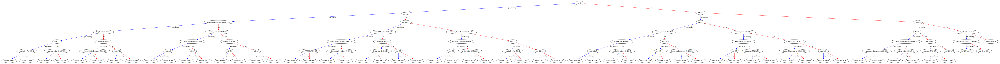

In [76]:
figure = xgb.plot_tree(xgb_model)
fig = plt.gcf()
fig.set_size_inches(150, 200)
fig.savefig('tree.png')

# Predict on test data

### Get preds using best model

In [97]:
test_df = pd.read_csv('data/test.csv')

In [98]:
test_df = fill_county_nans(test_df)
test_feat_df = featurizer.featurize(test_df)

  0%|          | 0/4 [00:00<?, ?it/s]

/home/dev2/anaconda3/envs/abzooba/lib/python3.9/site-packages/pandas/core/indexing.py:1637: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


In [99]:
%%time
test_preds = xgb_model.predict(test_feat_df)

CPU times: user 77.7 ms, sys: 19 ms, total: 96.7 ms
Wall time: 38.6 ms


### Export preds in the required format

In [100]:
test_preds_df = pd.DataFrame(test_df['id'])
test_preds_df['rent'] = test_preds
test_preds_df.to_csv('submission.csv', index=False)

### =====================================================